# EE551 - Embedded Image Processing

## Image Filtering - smoothing and denoise

## Import libraries

In [1]:
%matplotlib inline 
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit

from skimage import data, img_as_float, img_as_ubyte, exposure, io, color
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma

from skimage.util import random_noise

from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage, misc
from math import log10, sqrt

### A few helper functions

In [2]:
def plot_image(image, title=''):
    pylab.title(title, size=20), pylab.imshow(image)
    pylab.axis('off') # comment this line if you want axis ticks
    
def compare_psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

## The basics - an introduction to convolution

### Applying convolution to a grayscale image -  average filter

0.9921568627450982
(256, 256)


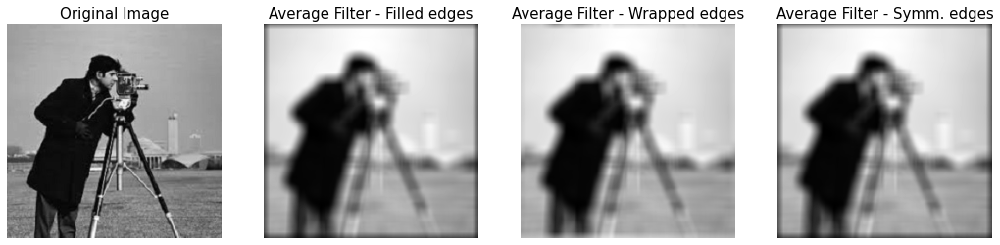

In [22]:
im = rgb2gray(imread('../images/cameraman.jpg')).astype(float)
print(np.max(im))
print(im.shape)

# simple definition of averaging blur kernel
# highly advised not to define a kernel by hardcoding like this. It is very easy to forget to change the denominator
average_kernel = np.ones((3,3)) / 3

# better way to define averaging kernel
height = 15
width = 15
average_kernel = np.ones((height,width)) / (height*width)

# apply average filter
im_blurred_fill = signal.convolve2d(im, average_kernel,mode='same', boundary='fill')
im_blurred_wrap = signal.convolve2d(im, average_kernel,mode='same', boundary='wrap')
im_blurred_symm = signal.convolve2d(im, average_kernel,mode='same', boundary='symm')

# plot results
fig, axes = pylab.subplots(ncols=4, sharex=True, sharey=True, figsize=(18,6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=15)
axes[1].imshow(im_blurred_fill, cmap=pylab.cm.gray)
axes[1].set_title('Average Filter - Filled edges', size=15)
axes[2].imshow(im_blurred_wrap, cmap=pylab.cm.gray)
axes[2].set_title('Average Filter - Wrapped edges', size=15)
axes[3].imshow(im_blurred_fill, cmap=pylab.cm.gray)
axes[3].set_title('Average Filter - Symm. edges', size=15)
for ax in axes:
    ax.axis('off')
pylab.show()

### Laplacian filter - basic edge detector

0.9921568627450982
(256, 256)


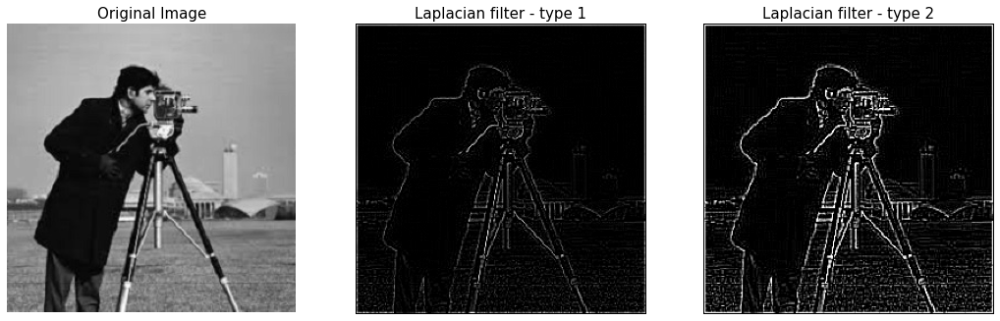

In [7]:
im = rgb2gray(imread('../images/cameraman.jpg')).astype(float)
print(np.max(im))
print(im.shape)

# there are two standard ways of implementing a laplacian filter. Let's look at both


#define LaPlace kernel - first implementation
edge_laplace_kernel_1 = np.array([[0,-1,0],[-1,4,-1],[0,-1,0]])

#define LaPlace kernel - second implementation
edge_laplace_kernel_2 = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])


# apply laplacian filter to find edges
im_edges_1 = np.clip(signal.convolve2d(im, edge_laplace_kernel_1), 0, 1)

im_edges_2 = np.clip(signal.convolve2d(im, edge_laplace_kernel_2), 0, 1)

# plot results
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18,6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=15)
axes[1].imshow(im_edges_1, cmap=pylab.cm.gray)
axes[1].set_title('Laplacian filter - type 1', size=15)
axes[2].imshow(im_edges_2, cmap=pylab.cm.gray)
axes[2].set_title('Laplacian filter - type 2', size=15)

for ax in axes:
    ax.axis('off')
pylab.show()

## Smoothing images
### Blur, noise reduction

### Smoothing with ImageFilter.BLUR

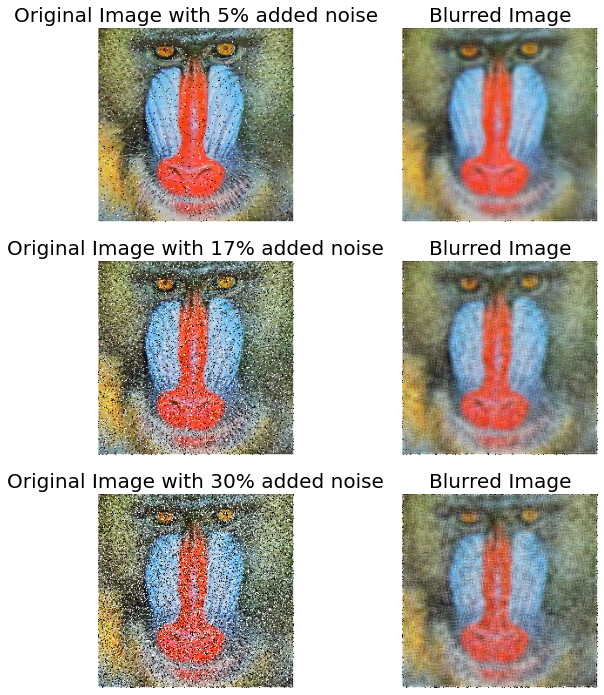

In [9]:
# Use the "out of the box" BLUR function in PIL to investigate the effect of smoothing on noise
# note: BLUR applies a Gaussian filter to the image

i = 1
pylab.figure(figsize=(10,25))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('../images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # generate salt-and-pepper noise
    #im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    pylab.subplot(6,2,i), plot_image(im, 'Original Image with ' +
    str(int(100*prop_noise)) + '% added noise')
    i += 1
    im1 = im.filter(ImageFilter.BLUR)
    pylab.subplot(6,2,i), plot_image(im1, 'Blurred Image')
    i += 1
pylab.show()

### Smoothing by averaging with the box blur kernel

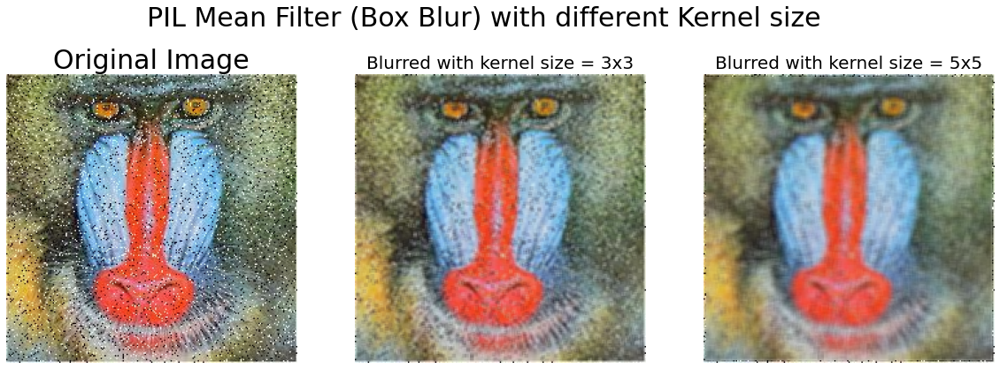

In [10]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
pylab.figure(figsize=(20,7))
pylab.subplot(1,3,1), pylab.imshow(im), pylab.title('Original Image', size=30), pylab.axis('off')
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    pylab.subplot(1,3,(2 if n==3 else 3))
    plot_image(im1, 'Blurred with kernel size = ' + str(n) + 'x' + str(n))
pylab.suptitle('PIL Mean Filter (Box Blur) with different Kernel size',
size=30)
pylab.show()

### Smoothing with the Gaussian blur filter

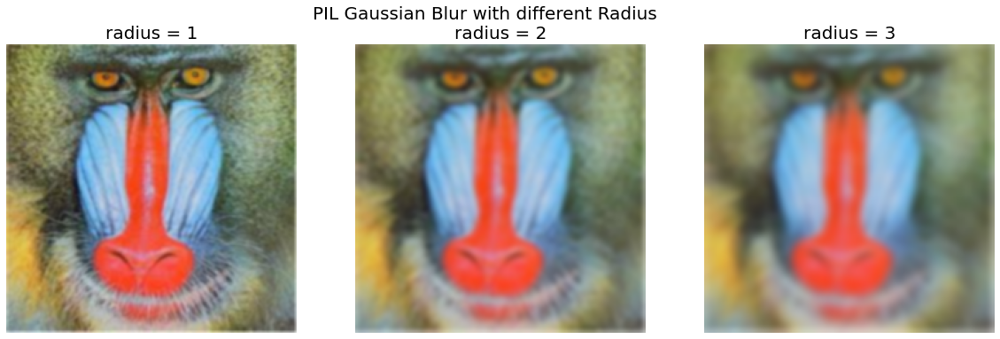

In [13]:
im = Image.open('../images/mandrill_spnoise_0.2.jpg')
im = Image.open('../images/mandrill.jpg')
pylab.figure(figsize=(20,6))
i = 1
for radius in range(1, 4):
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    pylab.subplot(1,3,i), plot_image(im1, 'radius = ' +
    str(round(radius,2)))
    i += 1
pylab.suptitle('PIL Gaussian Blur with different Radius', size=20)
pylab.show()

### Comparing smoothing with box and Gaussian kernels using SciPy ndimage

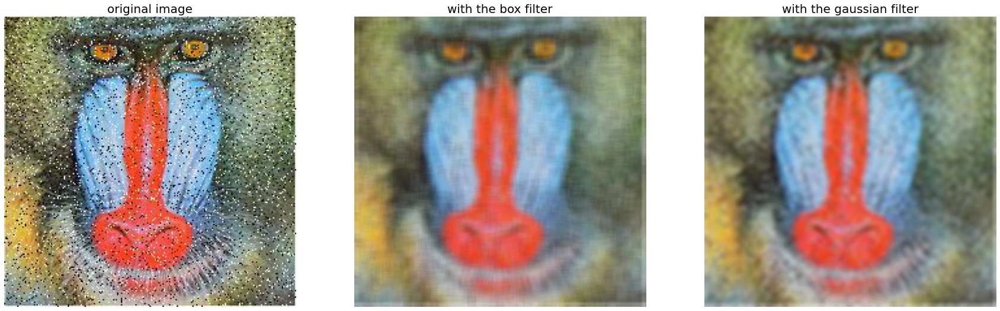

In [38]:
#in this section, we will implement averaging (box) and Gaussian filters with scipy
from scipy import ndimage
import matplotlib.pylab as pylab
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
k = 7 # 7x7 kernel
im_box = ndimage.uniform_filter(im, size=(k,k,1))
s = 2 # sigma value
t = (((k - 1)/2)-0.5)/s # truncate parameter value for a kxk gaussian kernel with sigma s
im_gaussian = ndimage.gaussian_filter(im, sigma=(s,s,0), truncate=t)
fig = pylab.figure(figsize=(30,10))
pylab.subplot(131), plot_image(im, 'original image')
pylab.subplot(132), plot_image(im_box, 'with the box filter')
pylab.subplot(133), plot_image(im_gaussian, 'with the gaussian filter')
pylab.show()

### Using the median filter

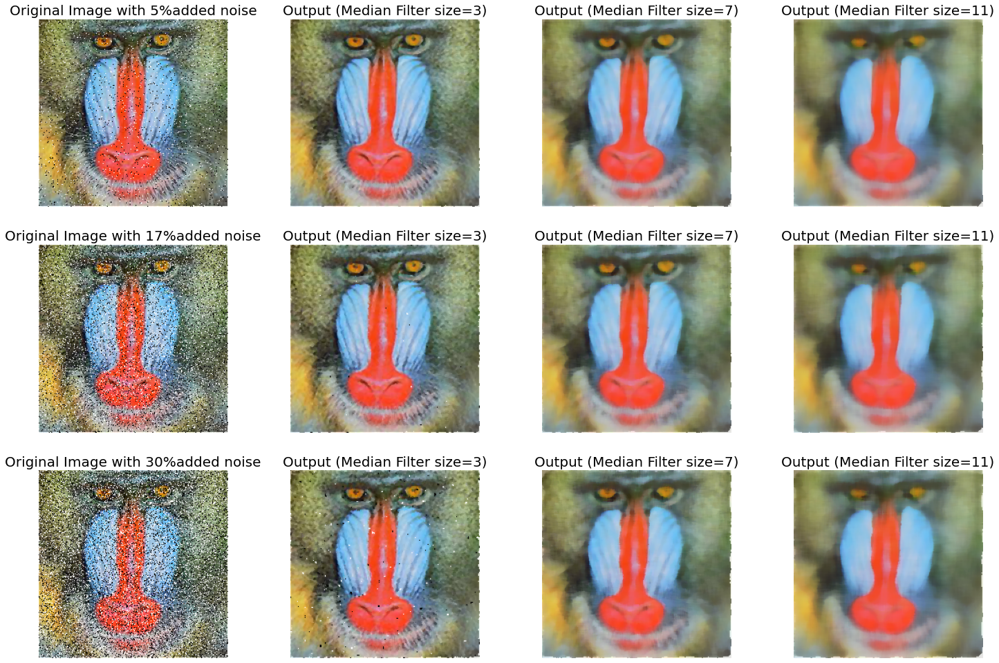

In [39]:
i = 1
pylab.figure(figsize=(25,35))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('../images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
    #im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    pylab.subplot(6,4,i)
    plot_image(im, 'Original Image with ' + str(int(100*prop_noise)) + '%added noise')
    i += 1
    for sz in [3,7,11]:
        im1 = im.filter(ImageFilter.MedianFilter(size=sz))
        pylab.subplot(6,4,i), plot_image(im1, 'Output (Median Filter size=' +  str(sz) + ')')
        i += 1
pylab.show()

### Using max and min filter

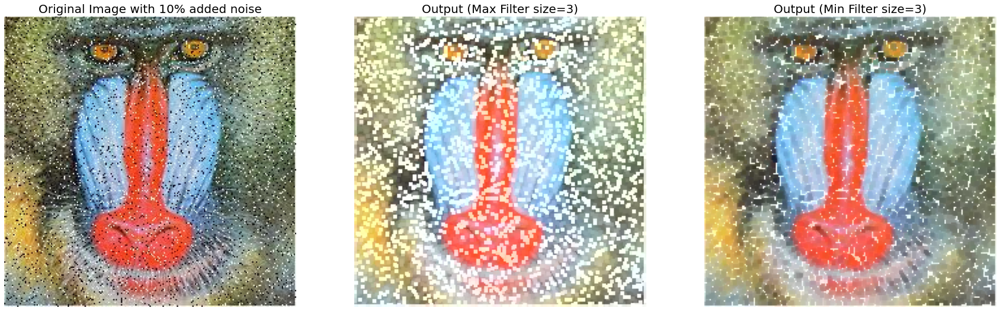

In [14]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
pylab.figure(figsize=(30,10))
sz = 3
pylab.subplot(1,3,1)
plot_image(im, 'Original Image with 10% added noise')
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
pylab.subplot(1,3,2), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
im1 = im1.filter(ImageFilter.MinFilter(size=sz))
pylab.subplot(1,3,3), plot_image(im1, 'Output (Min Filter size=' + str(sz)+ ')')
pylab.show()

### Using max min filter as an edge detector

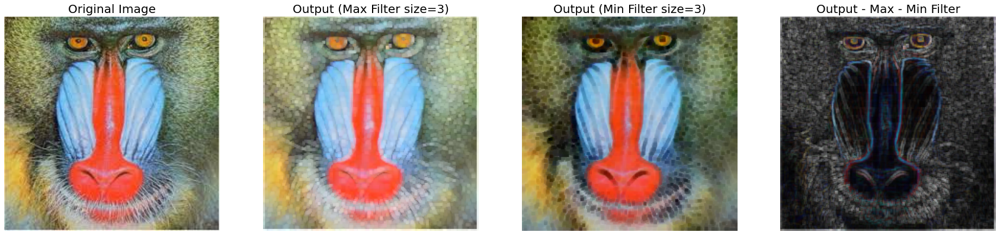

In [15]:
im = Image.open('../images/mandrill.jpg')
pylab.figure(figsize=(30,10))
sz = 3
pylab.subplot(1,4,1)
plot_image(im, 'Original Image')
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
pylab.subplot(1,4,2), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
im2 = im.filter(ImageFilter.MinFilter(size=sz))
pylab.subplot(1,4,3), plot_image(im2, 'Output (Min Filter size=' + str(sz)+ ')')
im3 = np.subtract(im1,im2)
pylab.subplot(1,4,4), plot_image(im3, 'Output - Max - Min Filter')
pylab.show()

### Using the bilateral filter

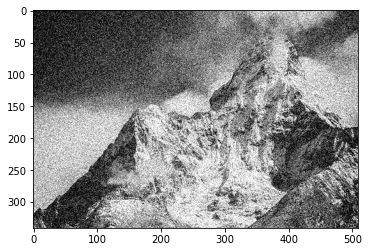

In [16]:
im = color.rgb2gray(img_as_float(io.imread('../images/mountain.png')))
sigma = 0.155
noisy = random_noise(im, var=sigma**2)
pylab.imshow(noisy, cmap=pylab.cm.gray)

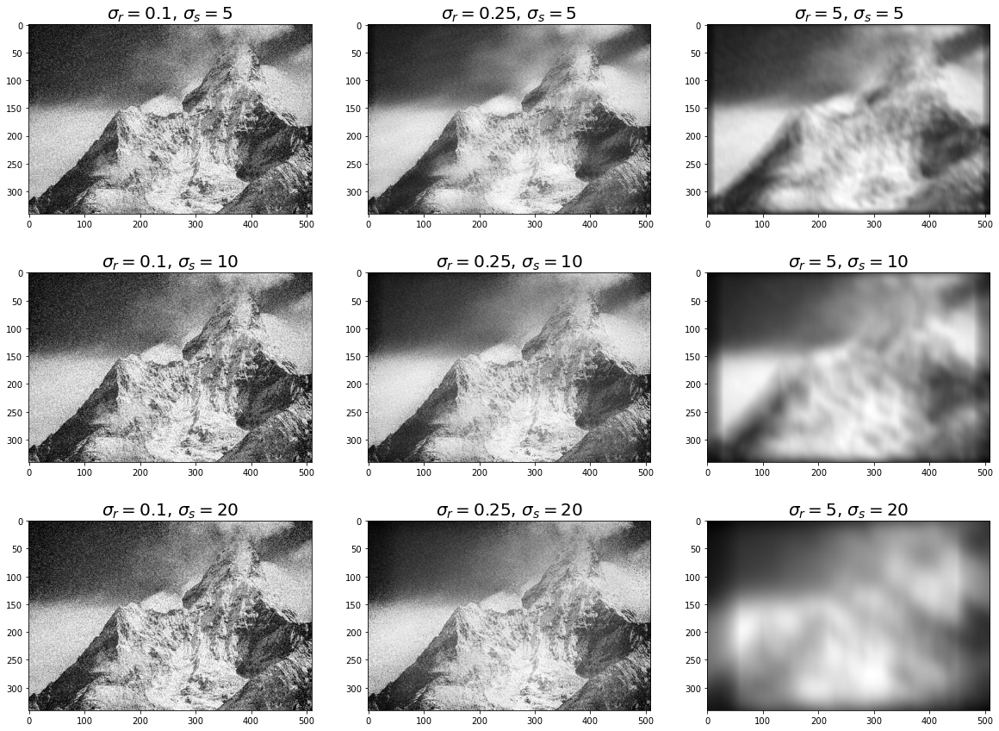

In [44]:
pylab.figure(figsize=(20,15))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        pylab.subplot(3,3,i)
        pylab.imshow(denoise_bilateral(noisy, sigma_color=sigma_col,
        sigma_spatial=sigma_sp, multichannel=False),cmap=pylab.cm.gray)
        pylab.title(r'$\sigma_r=$' + str(sigma_col) + r', $\sigma_s=$' + str(sigma_sp), size=20)
        i += 1
pylab.show()

### Using non-local means

estimated noise standard deviation = 0.21998129100221472
PSNR (noisy) = 61.16
PSNR (slow) = 74.03
PSNR (fast) = 73.66


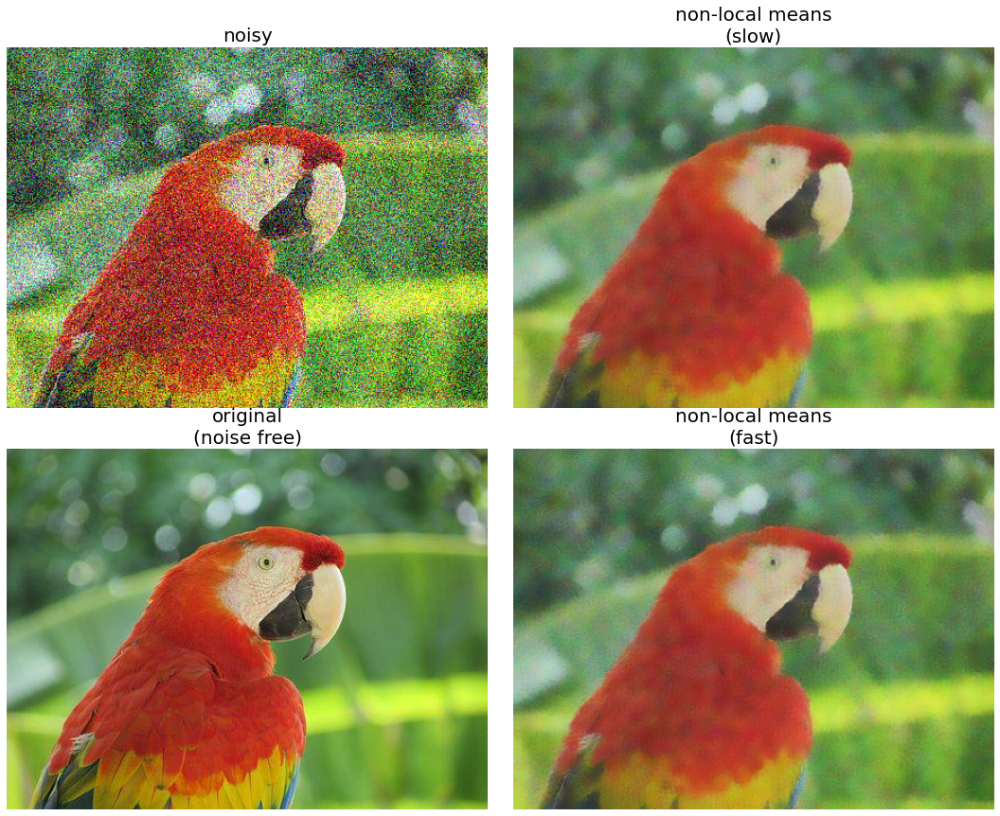

In [51]:
def plot_image_axes(image, axes, title):
    axes.imshow(image)
    axes.axis('off')
    axes.set_title(title, size=20)
    
parrot = img_as_float(imread('../images/parrot.png'))
sigma = 0.25
noisy = parrot + sigma * np.random.standard_normal(parrot.shape)
noisy = np.clip(noisy, 0, 1)
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))
# estimated noise standard deviation = 0.22048519002358943
patch_kw = dict(patch_size=5, # 5x5 patches
patch_distance=6, # 13x13 search area
multichannel=True)
# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False,
**patch_kw)
# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True,
**patch_kw)
fig, axes = pylab.subplots(nrows=2, ncols=2, figsize=(15, 12), sharex=True,
sharey=True)
plot_image_axes(noisy, axes[0, 0], 'noisy')
plot_image_axes(denoise, axes[0, 1], 'non-local means\n(slow)')
plot_image_axes(parrot, axes[1, 0], 'original\n(noise free)')
plot_image_axes(denoise_fast, axes[1, 1], 'non-local means\n(fast)')
fig.tight_layout()
# PSNR metric values
psnr_noisy = compare_psnr(parrot, noisy)
psnr = compare_psnr(parrot, denoise.astype(np.float64))
psnr_fast = compare_psnr(parrot, denoise_fast.astype(np.float64))
print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
# PSNR (noisy) = 13.04 # PSNR (slow) = 26.25 # PSNR (fast) = 25.84
pylab.show()

### Smoothing with scipy ndimage percentile filter

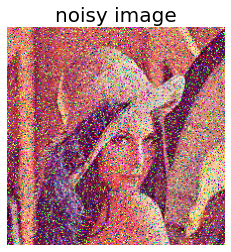

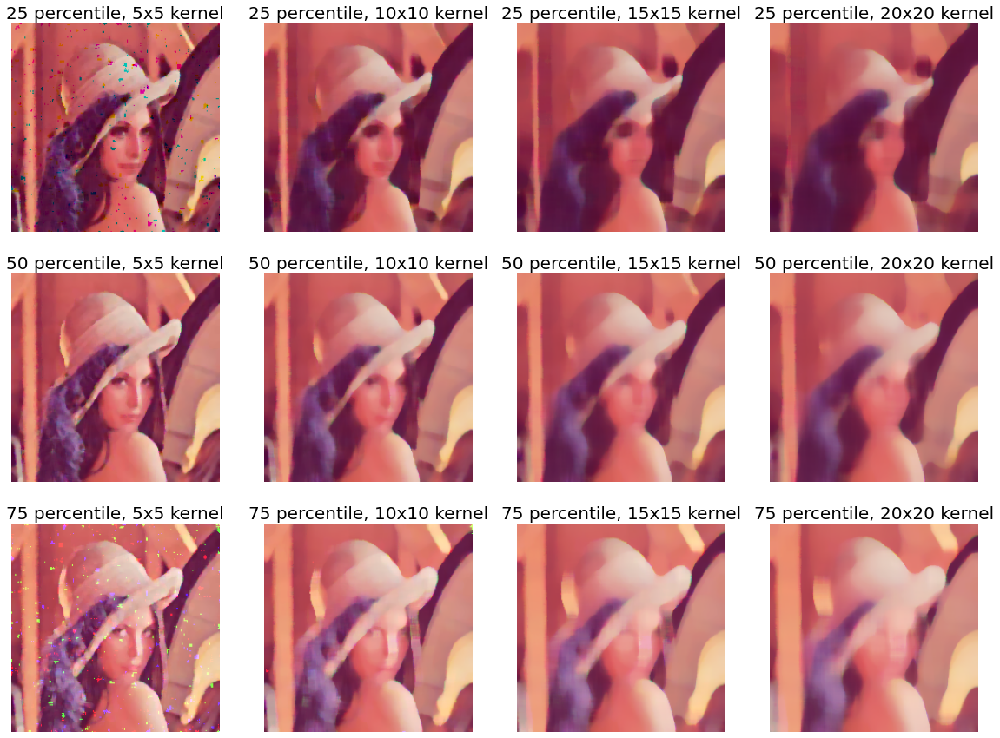

In [53]:
# the percentile filter is a generic version of the median filter (i.e. a median filter is a percentile filter where p =50%)
# in this example, the median filter (50% percentile) with a smaller kernel size does the best overall job of filtering salt
# and pepper noise, without removing too much detail

lena = imread('../images/lena.jpg')
# add salt-and-pepper noise to the input image
noise = np.random.random(lena.shape)
lena[noise > 0.9] = 255
lena[noise < 0.1] = 0
plot_image(lena, 'noisy image')
pylab.show()
fig = pylab.figure(figsize=(20,15))
i = 1
for p in range(25, 100, 25):
    for k in range(5, 25, 5):
        pylab.subplot(3,4,i)
        filtered = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
        plot_image(filtered, str(p) + ' percentile, ' + str(k) + 'x' + str(k) + ' kernel')
        i += 1
pylab.show()

## More advanced denoise
### The following section includes some more advanced denoise techniques. These are powerful, but not always practical for runtime or embedded appliocations. They are included here for information and completeness

### Image Denoising with Denoising Autoencoder

In [4]:
%pip install torch
%pip install torchvision
import torch, torchvision, matplotlib, sklearn, numpy as np
print(np.__version__, torch.__version__, matplotlib.__version__, sklearn.__version__) #torchvision.__version__, 

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.
1.20.3 1.12.0+cpu 3.4.3 0.24.2


  Using cached https://files.pythonhosted.org/packages/8f/8e/a9630c7786b846d08b47714dd363a051f5e37b4ea0e534460d8cdfc1644b/torchviz-0.0.1.tar.gz
  Created wheel for torchviz: filename=torchviz-0.0.1-cp37-none-any.whl size=3526 sha256=6a0044d414125e90b5fb81705e8ccab7f79ef152a1f7112f22f3fc42ec19928b
  Stored in directory: C:\Users\Sandipan.Dey\AppData\Local\pip\Cache\wheels\2a\c2\c5\b8b4d0f7992c735f6db5bfa3c5f354cf36502037ca2b585667
Successfully built torchviz
(1288, 50, 37)
epoch [1/100], loss:0.6654, MSE_loss:0.0152
epoch [2/100], loss:0.6684, MSE_loss:0.0182
epoch [3/100], loss:0.6653, MSE_loss:0.0107
epoch [4/100], loss:0.6448, MSE_loss:0.0122
epoch [5/100], loss:0.6600, MSE_loss:0.0120
epoch [6/100], loss:0.6396, MSE_loss:0.0115
epoch [7/100], loss:0.6504, MSE_loss:0.0124
epoch [8/100], loss:0.6491, MSE_loss:0.0098
epoch [9/100], loss:0.6496, MSE_loss:0.0090
epoch [10/100], loss:0.6443, MSE_loss:0.0112


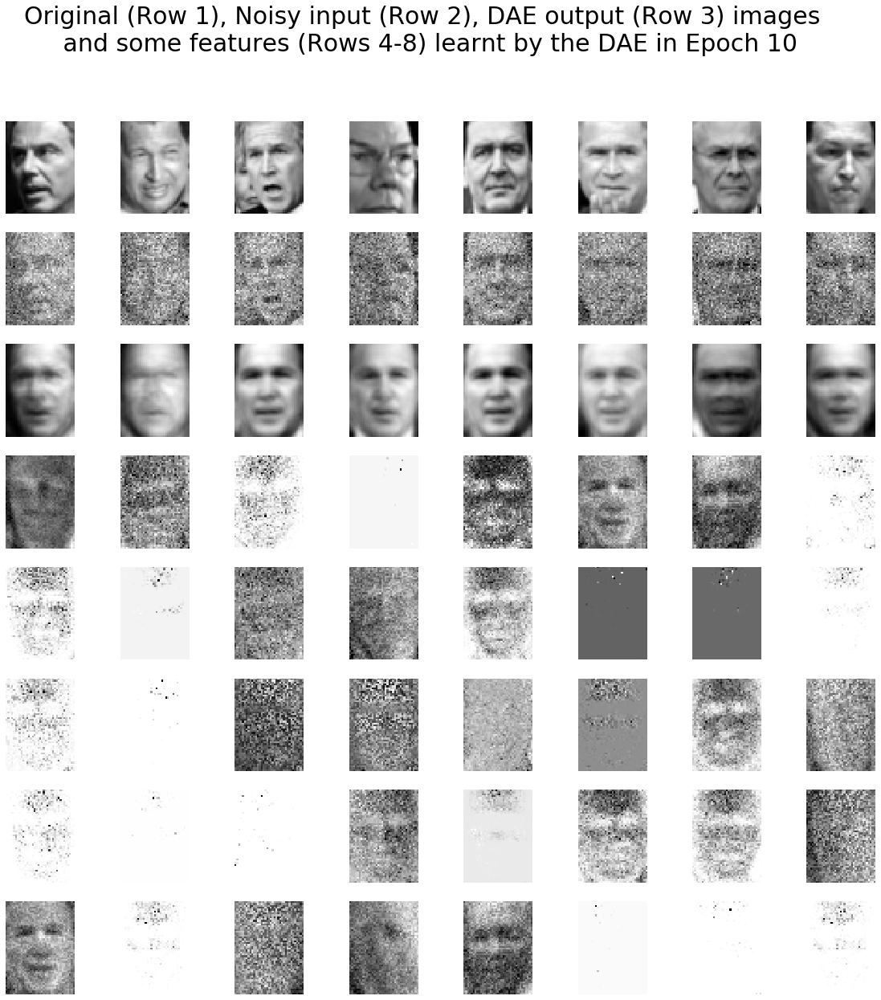

epoch [11/100], loss:0.6493, MSE_loss:0.0110
epoch [12/100], loss:0.6543, MSE_loss:0.0104
epoch [13/100], loss:0.6474, MSE_loss:0.0100
epoch [14/100], loss:0.6643, MSE_loss:0.0084
epoch [15/100], loss:0.6529, MSE_loss:0.0089
epoch [16/100], loss:0.6451, MSE_loss:0.0089
epoch [17/100], loss:0.6329, MSE_loss:0.0092
epoch [18/100], loss:0.6588, MSE_loss:0.0076
epoch [19/100], loss:0.6415, MSE_loss:0.0082
epoch [20/100], loss:0.6374, MSE_loss:0.0085


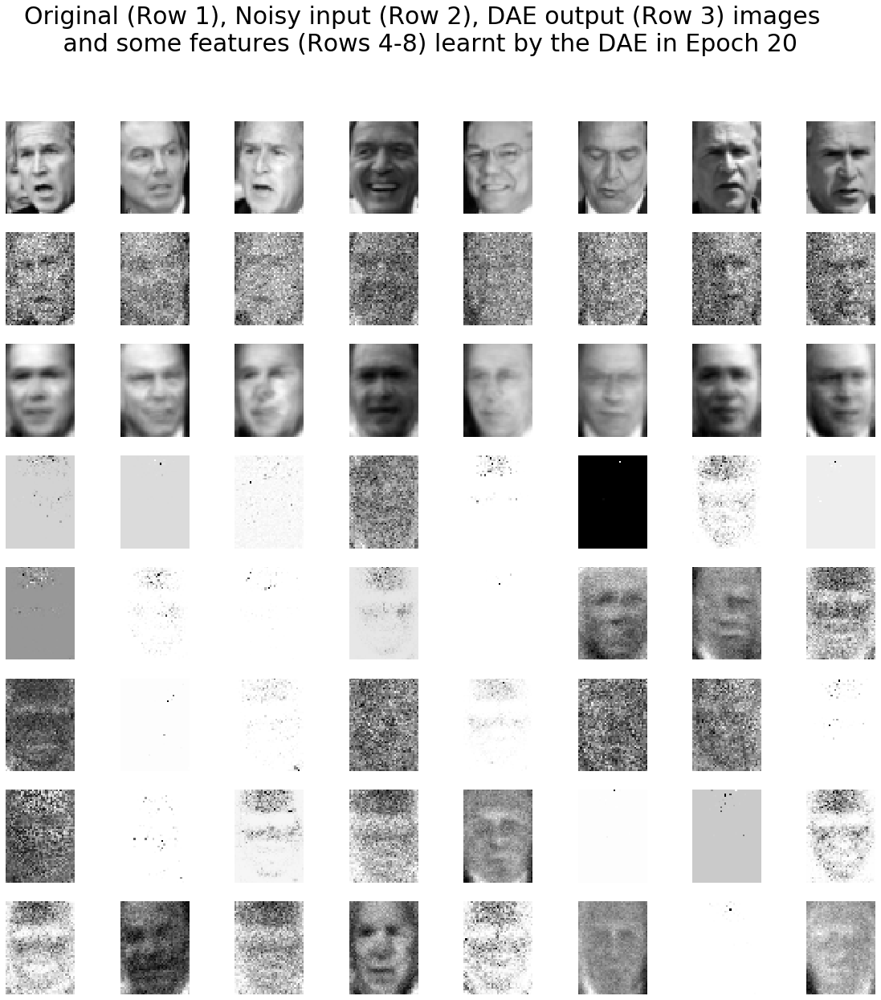

epoch [21/100], loss:0.6500, MSE_loss:0.0085
epoch [22/100], loss:0.6412, MSE_loss:0.0078
epoch [23/100], loss:0.6514, MSE_loss:0.0077
epoch [24/100], loss:0.6345, MSE_loss:0.0075
epoch [25/100], loss:0.6529, MSE_loss:0.0098
epoch [26/100], loss:0.6449, MSE_loss:0.0073
epoch [27/100], loss:0.6420, MSE_loss:0.0083
epoch [28/100], loss:0.6486, MSE_loss:0.0069
epoch [29/100], loss:0.6529, MSE_loss:0.0065
epoch [30/100], loss:0.6461, MSE_loss:0.0067


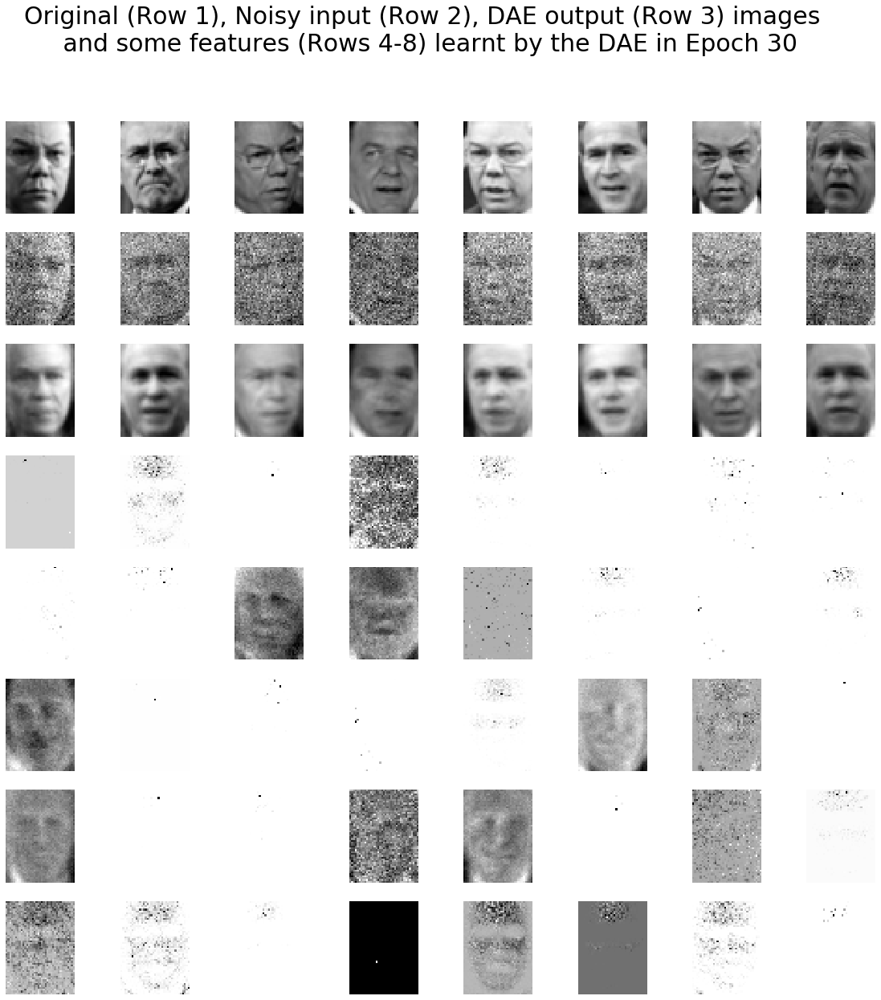

epoch [31/100], loss:0.6361, MSE_loss:0.0082
epoch [32/100], loss:0.6365, MSE_loss:0.0071
epoch [33/100], loss:0.6392, MSE_loss:0.0072
epoch [34/100], loss:0.6411, MSE_loss:0.0061
epoch [35/100], loss:0.6547, MSE_loss:0.0064
epoch [36/100], loss:0.6471, MSE_loss:0.0082
epoch [37/100], loss:0.6483, MSE_loss:0.0067
epoch [38/100], loss:0.6453, MSE_loss:0.0067
epoch [39/100], loss:0.6506, MSE_loss:0.0064
epoch [40/100], loss:0.6383, MSE_loss:0.0074


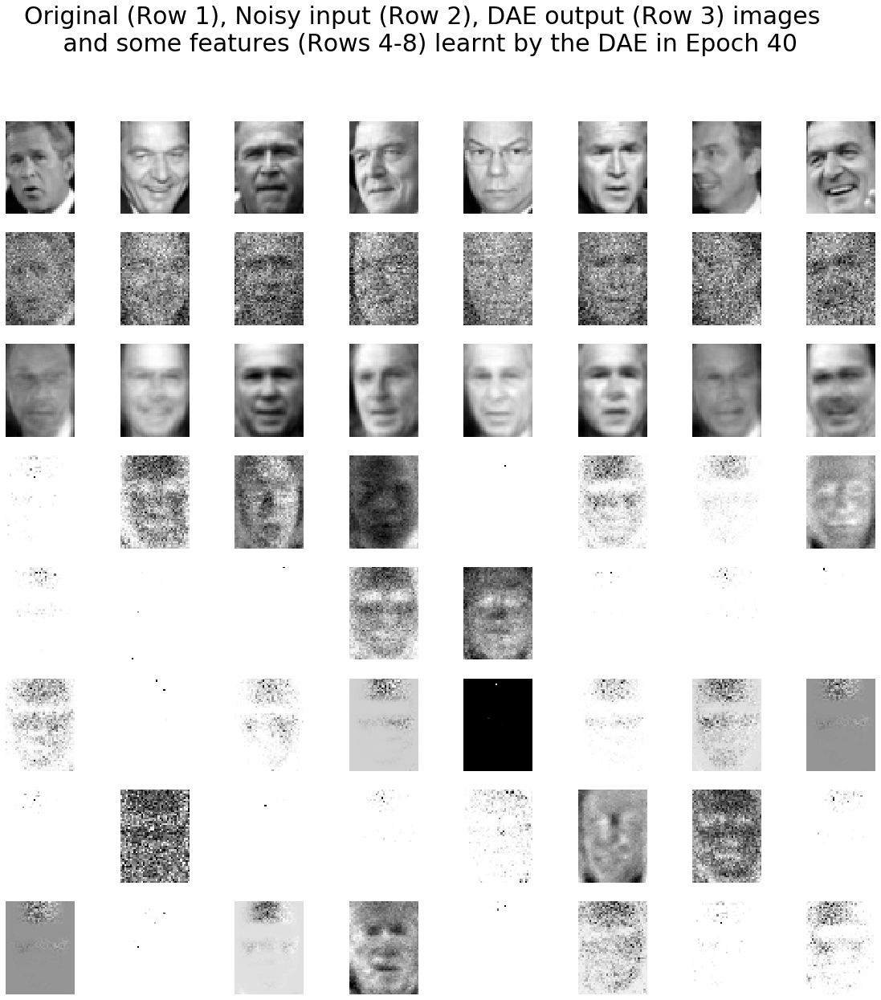

epoch [41/100], loss:0.6410, MSE_loss:0.0071
epoch [42/100], loss:0.6324, MSE_loss:0.0072
epoch [43/100], loss:0.6462, MSE_loss:0.0079
epoch [44/100], loss:0.6537, MSE_loss:0.0060
epoch [45/100], loss:0.6432, MSE_loss:0.0064
epoch [46/100], loss:0.6370, MSE_loss:0.0076
epoch [47/100], loss:0.6495, MSE_loss:0.0064
epoch [48/100], loss:0.6358, MSE_loss:0.0063
epoch [49/100], loss:0.6375, MSE_loss:0.0073
epoch [50/100], loss:0.6307, MSE_loss:0.0074


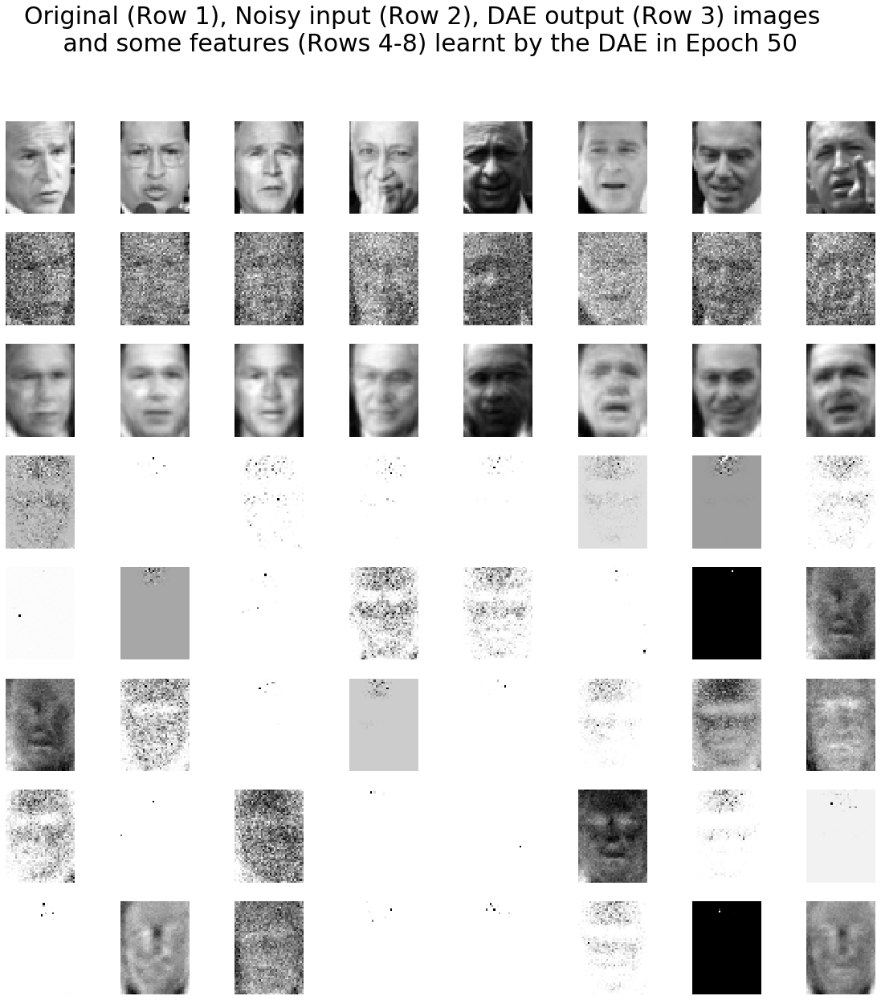

epoch [51/100], loss:0.6347, MSE_loss:0.0083
epoch [52/100], loss:0.6396, MSE_loss:0.0084
epoch [53/100], loss:0.6393, MSE_loss:0.0062
epoch [54/100], loss:0.6450, MSE_loss:0.0071
epoch [55/100], loss:0.6439, MSE_loss:0.0059
epoch [56/100], loss:0.6226, MSE_loss:0.0056
epoch [57/100], loss:0.6417, MSE_loss:0.0074
epoch [58/100], loss:0.6538, MSE_loss:0.0076
epoch [59/100], loss:0.6557, MSE_loss:0.0049
epoch [60/100], loss:0.6453, MSE_loss:0.0073


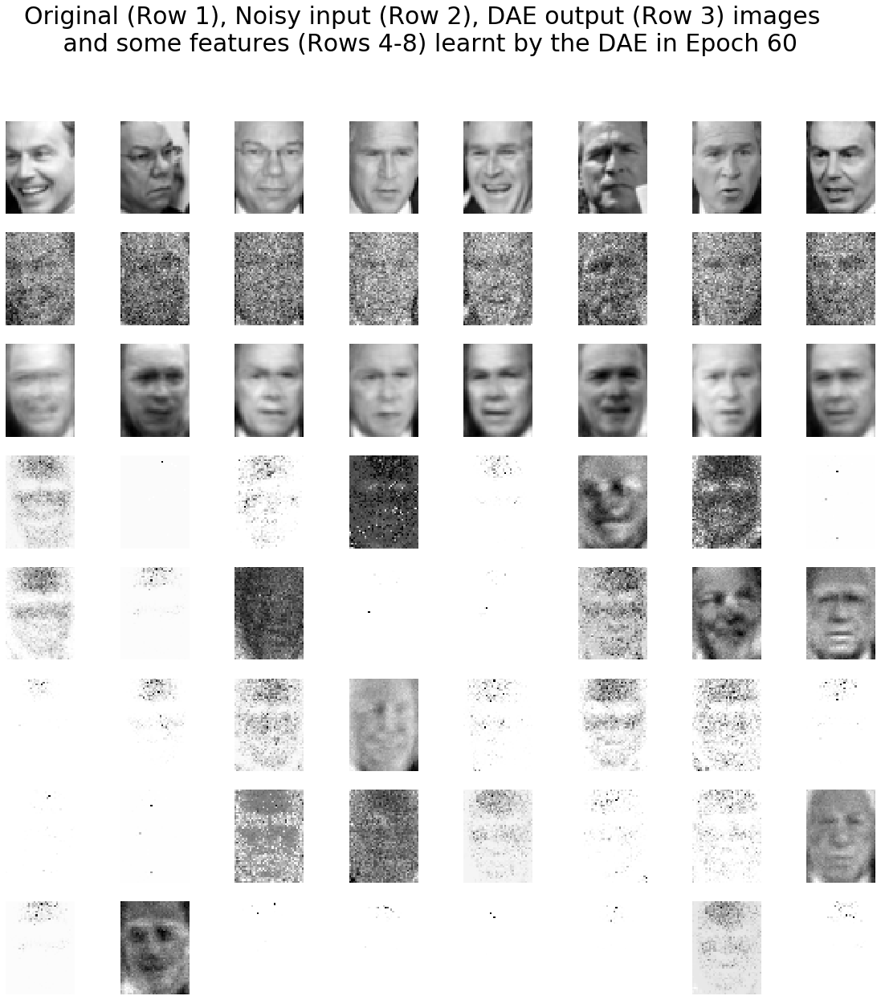

epoch [61/100], loss:0.6420, MSE_loss:0.0060
epoch [62/100], loss:0.6487, MSE_loss:0.0066
epoch [63/100], loss:0.6417, MSE_loss:0.0064
epoch [64/100], loss:0.6427, MSE_loss:0.0049
epoch [65/100], loss:0.6476, MSE_loss:0.0063
epoch [66/100], loss:0.6547, MSE_loss:0.0059
epoch [67/100], loss:0.6431, MSE_loss:0.0069
epoch [68/100], loss:0.6471, MSE_loss:0.0057
epoch [69/100], loss:0.6549, MSE_loss:0.0050
epoch [70/100], loss:0.6289, MSE_loss:0.0062


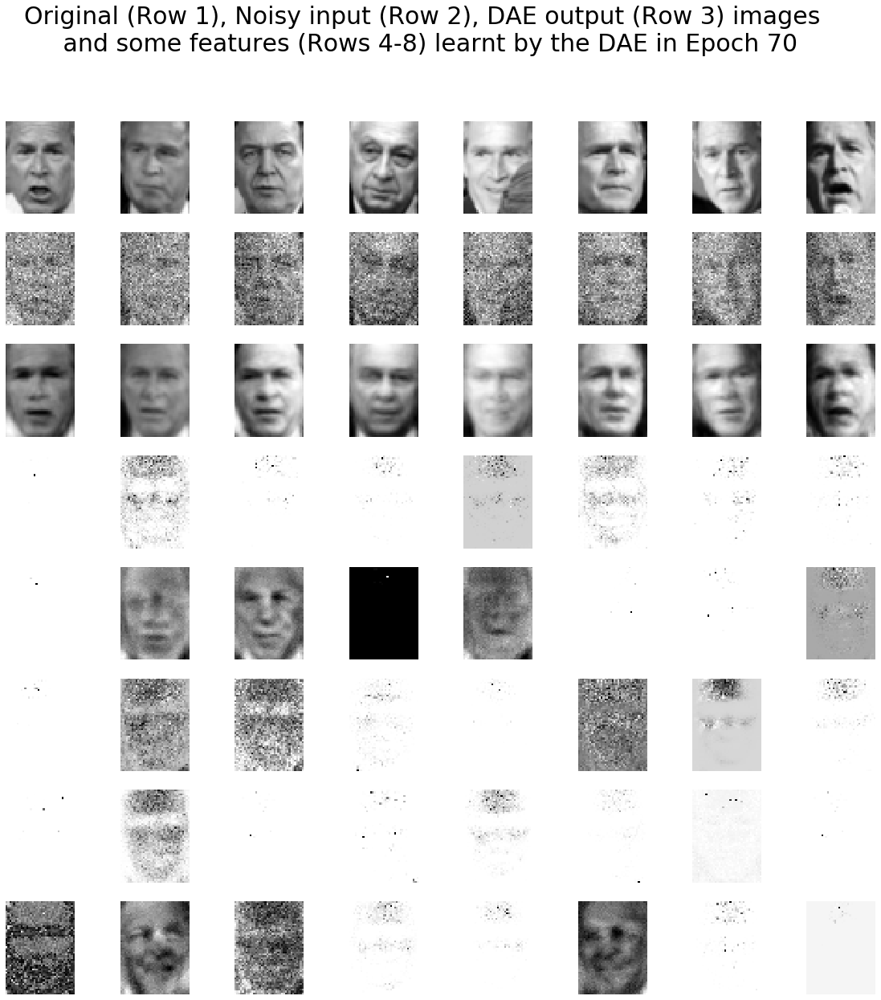

epoch [71/100], loss:0.6589, MSE_loss:0.0077
epoch [72/100], loss:0.6478, MSE_loss:0.0054
epoch [73/100], loss:0.6449, MSE_loss:0.0064
epoch [74/100], loss:0.6440, MSE_loss:0.0064
epoch [75/100], loss:0.6405, MSE_loss:0.0056
epoch [76/100], loss:0.6479, MSE_loss:0.0045
epoch [77/100], loss:0.6400, MSE_loss:0.0050
epoch [78/100], loss:0.6413, MSE_loss:0.0055
epoch [79/100], loss:0.6543, MSE_loss:0.0065
epoch [80/100], loss:0.6337, MSE_loss:0.0064


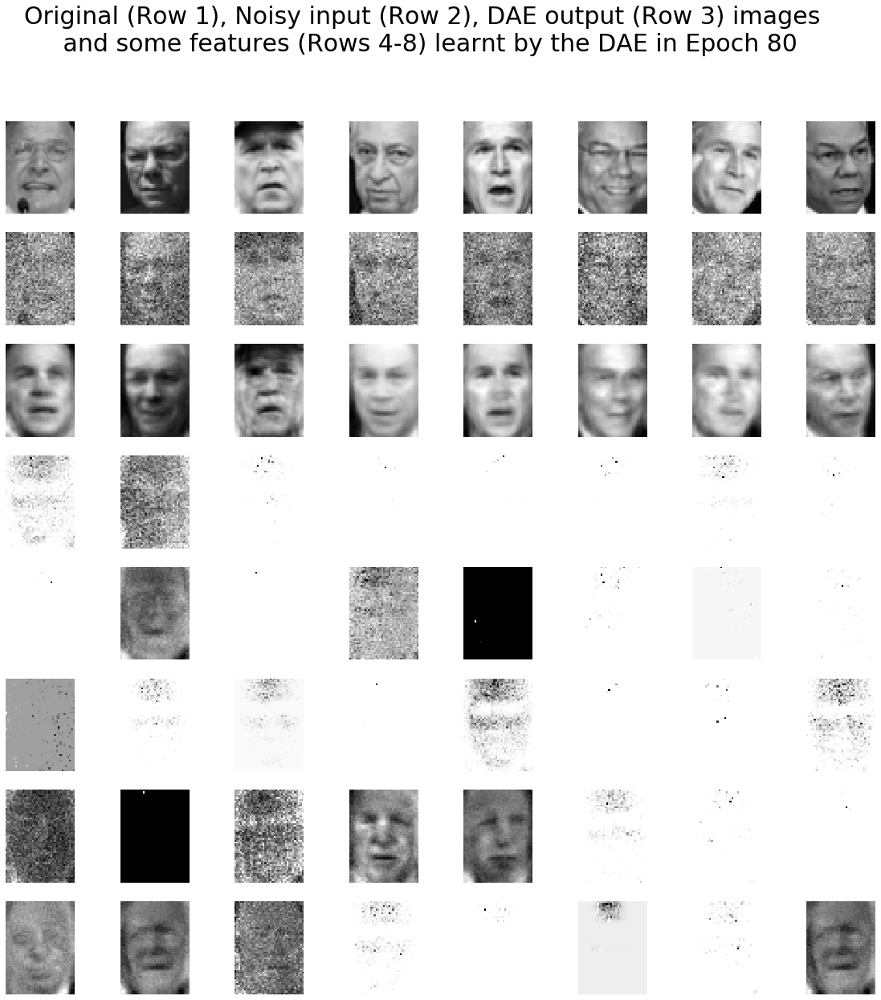

epoch [81/100], loss:0.6471, MSE_loss:0.0055
epoch [82/100], loss:0.6451, MSE_loss:0.0055
epoch [83/100], loss:0.6221, MSE_loss:0.0065
epoch [84/100], loss:0.6315, MSE_loss:0.0061
epoch [85/100], loss:0.6417, MSE_loss:0.0067
epoch [86/100], loss:0.6241, MSE_loss:0.0064
epoch [87/100], loss:0.6553, MSE_loss:0.0060
epoch [88/100], loss:0.6257, MSE_loss:0.0063
epoch [89/100], loss:0.6353, MSE_loss:0.0064
epoch [90/100], loss:0.6454, MSE_loss:0.0061


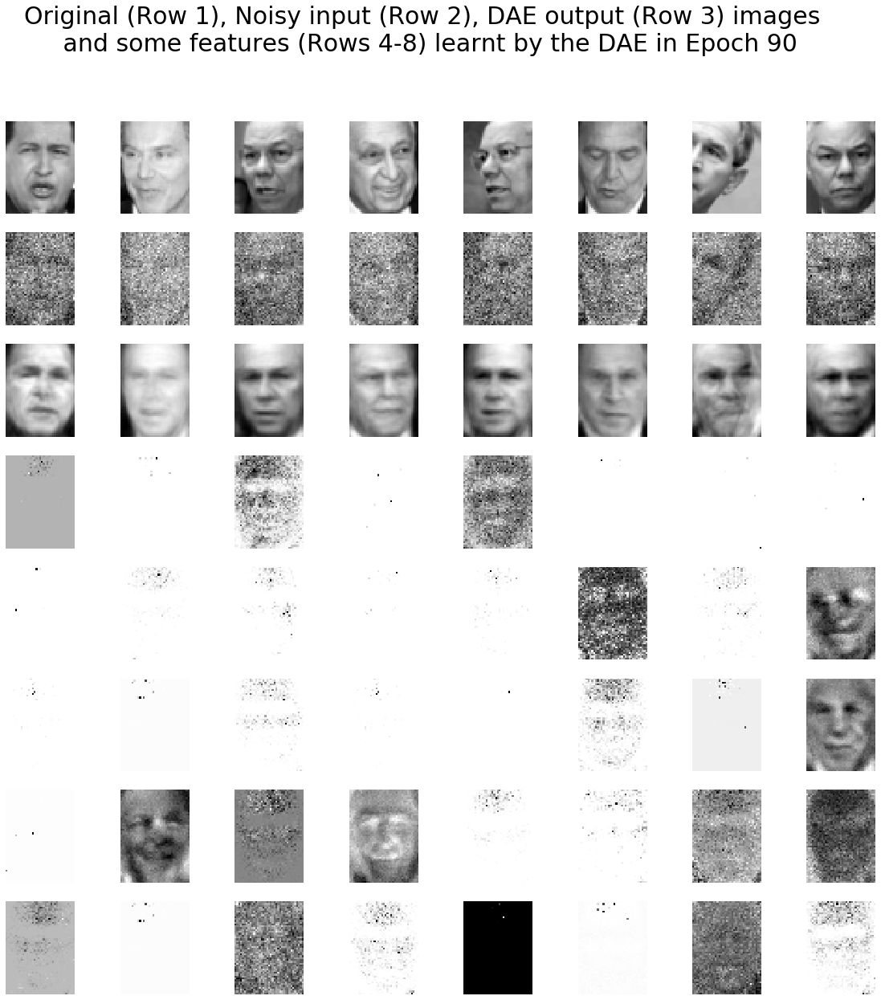

epoch [91/100], loss:0.6427, MSE_loss:0.0071
epoch [92/100], loss:0.6574, MSE_loss:0.0050
epoch [93/100], loss:0.6329, MSE_loss:0.0080
epoch [94/100], loss:0.6352, MSE_loss:0.0072
epoch [95/100], loss:0.6402, MSE_loss:0.0054
epoch [96/100], loss:0.6406, MSE_loss:0.0075
epoch [97/100], loss:0.6376, MSE_loss:0.0057
epoch [98/100], loss:0.6267, MSE_loss:0.0074
epoch [99/100], loss:0.6358, MSE_loss:0.0061
epoch [100/100], loss:0.6287, MSE_loss:0.0057


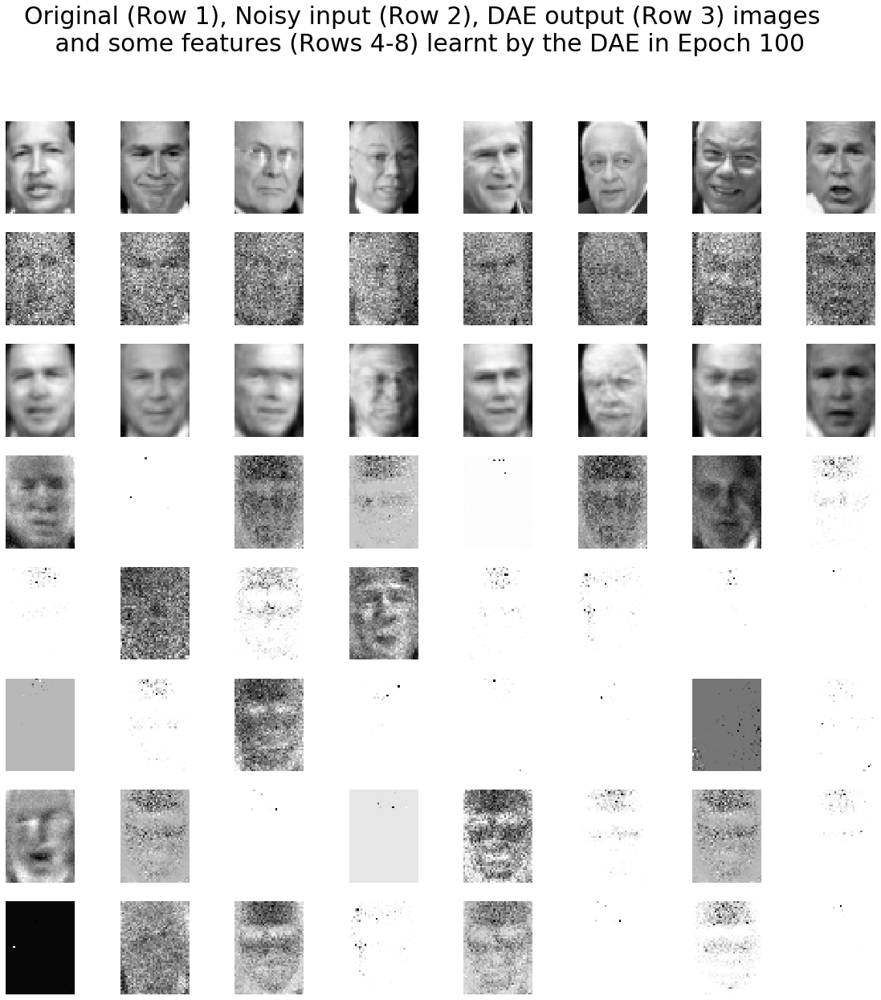

In [3]:
import os
import numpy as np
import matplotlib.pylab as plt
#! pip install torchviz
import torch
from torch import nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import save_image
from torchviz import make_dot

from sklearn.datasets import fetch_lfw_people

#print(torch.cuda.current_device())
#print(torch.cuda.device(0))
#print(torch.cuda.device_count())
#print(torch.cuda.get_device_name(0))

def to_img(x):
    x = x.view(x.size(0), 1, 50, 37)
    return x

num_epochs = 100 #100
batch_size = 8 # 16
learning_rate = 1e-3
cuda = False #True 


def add_noise(img):
    noise = torch.randn(img.size()) * 0.2
    noisy_img = img + noise
    return noisy_img


def plot_sample_img(img, name):
    img = img.view(1, 50, 37)
    save_image(img, './sample_{}.png'.format(name))


def min_max_normalization(tensor, min_value, max_value):
    min_tensor = tensor.min()
    tensor = (tensor - min_tensor)
    max_tensor = tensor.max()
    tensor = tensor / max_tensor
    tensor = tensor * (max_value - min_value) + min_value
    return tensor


def tensor_round(tensor):
    return torch.round(tensor)


img_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda tensor:min_max_normalization(tensor, 0, 1)),
    transforms.Lambda(lambda tensor:tensor_round(tensor))
])

dataset = fetch_lfw_people(min_faces_per_person=70, resize=0.4).images / 255
print(dataset.shape)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

class autoencoder(nn.Module):
    def __init__(self):
        super(autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(50 * 37, 512),
            nn.ReLU(True),
            nn.Linear(512, 128),
            nn.ReLU(True))
        self.decoder = nn.Sequential(
            nn.Linear(128, 512),
            nn.ReLU(True),
            nn.Linear(512, 50 * 37),
            nn.Sigmoid())

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

model = autoencoder()
if cuda:
    model = model.cuda()
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(
    model.parameters(), lr=learning_rate, weight_decay=1e-5)

for epoch in range(1, num_epochs+1):
    for data in dataloader:
        img = data
        img = img.view(img.size(0), -1)
        noisy_img = add_noise(img)
        noisy_img = Variable(noisy_img)
        if cuda:
            noisy_img = noisy_img.cuda()
        img = Variable(img)
        if cuda:
            img = img.cuda()
        # ===================forward=====================
        output = model(noisy_img)
        loss = criterion(output, img)
        MSE_loss = nn.MSELoss()(output, img)
        # ===================backward====================
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    # ===================log========================
    print('epoch [{}/{}], loss:{:.4f}, MSE_loss:{:.4f}'
          .format(epoch, num_epochs, loss.data.item(), MSE_loss.data.item()))
    if epoch % 10 == 0:
        x = to_img(img.cpu().data)
        x_hat = to_img(output.cpu().data)
        x_noisy = to_img(noisy_img.cpu().data)
        weights = to_img(model.encoder[0].weight.cpu().data)
        plt.figure(figsize=(20,20))
        plt.gray()
        for i in range(8):
            plt.subplot(8,8,i+1), plt.imshow(x.data.numpy()[i,0,...]), plt.axis('off')
        for i in range(8):
            plt.subplot(8,8,i+9), plt.imshow(x_noisy.data.numpy()[i,0,...]), plt.axis('off')
        for i in range(8):
            plt.subplot(8,8,i+17), plt.imshow(x_hat.data.numpy()[i,0,...]), plt.axis('off')
        indices = np.random.choice(512, 40)
        for i in range(40):
            plt.subplot(8,8,i+25), plt.imshow(weights.data.numpy()[indices[i],0,...]), plt.axis('off')
        plt.suptitle('Original (Row 1), Noisy input (Row 2), DAE output (Row 3) images \n and some features (Rows 4-8) learnt by the DAE in Epoch {}'.format(epoch), size=30)
        plt.show()
        #print(weights.shape)

#torch.save(model.state_dict(), './sim_dautoencoder.pth')

In [32]:
print(model)

autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=1850, out_features=512, bias=True)
    (1): ReLU(inplace)
    (2): Linear(in_features=512, out_features=128, bias=True)
    (3): ReLU(inplace)
  )
  (decoder): Sequential(
    (0): Linear(in_features=128, out_features=512, bias=True)
    (1): ReLU(inplace)
    (2): Linear(in_features=512, out_features=1850, bias=True)
    (3): Sigmoid()
  )
)


### Image Denoising with Principal Component Analysis (PCA), Discrete Fourier / Wavelet Tranform (FFT, DWT)

(400, 4096)
Extracting the top 50 PCs...
done in 0.165s


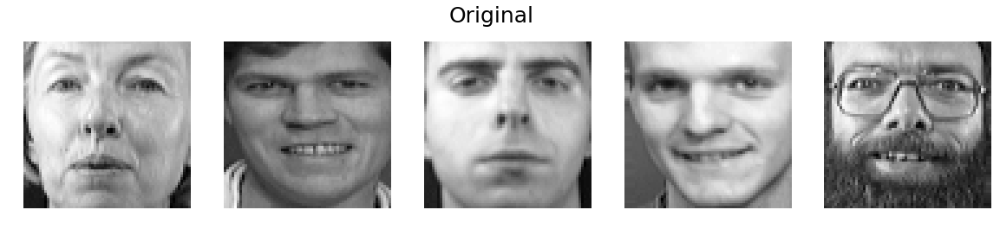

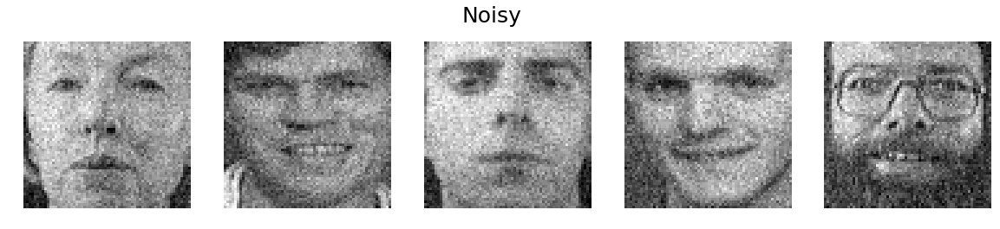

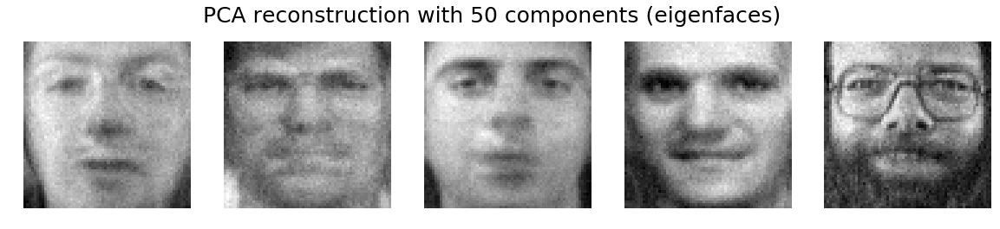

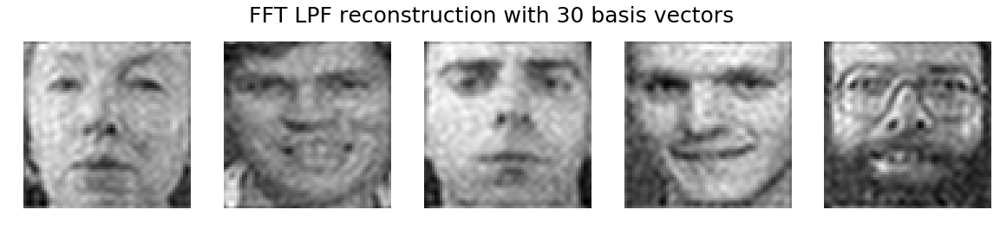

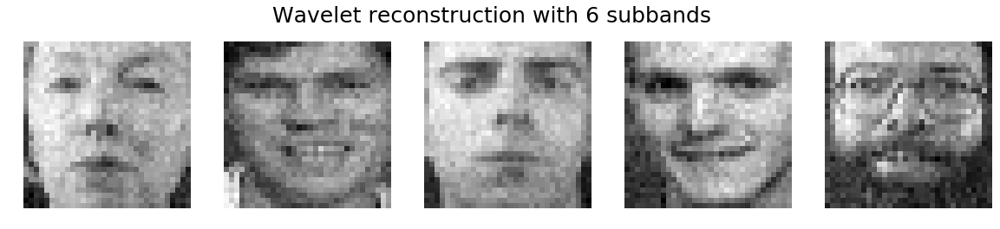

In [22]:
import numpy as np
from numpy.random import RandomState
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_olivetti_faces
from sklearn import decomposition
from skimage.util import random_noise
from skimage import img_as_float
from time import time
import scipy.fftpack as fp
import pywt

n_components = 50 # 256
image_shape = (64, 64)
rng = RandomState(0)

dataset = fetch_olivetti_faces(shuffle=True, random_state=rng)
original = img_as_float(dataset.data)
faces = original.copy()
print(faces.shape)

n_samples, n_features = faces.shape
#mean_face = faces.mean(axis=0)
#faces = faces - mean_face
faces = random_noise(faces, var=0.005)

estimator = decomposition.PCA(n_components=n_components, svd_solver='randomized', whiten=True)
print("Extracting the top %d PCs..." % (n_components))
t0 = time()
faces_recons = estimator.inverse_transform(estimator.fit_transform(faces)) #.T #+ mean_face #.T
train_time = (time() - t0)
print("done in %0.3fs" % train_time)

indices = np.random.choice(n_samples, 5, replace=False)
plt.figure(figsize=(20,4))
for i in range(len(indices)):
    plt.subplot(1,5,i+1), plt.imshow(np.reshape(original[indices[i],:], image_shape)), plt.axis('off')
plt.suptitle('Original', size=25)
plt.show()

#faces = faces + mean_face
plt.figure(figsize=(20,4))
for i in range(len(indices)):
    plt.subplot(1,5,i+1), plt.imshow(np.reshape(faces[indices[i],:], image_shape)), plt.axis('off')
plt.suptitle('Noisy', size=25)
plt.show()

plt.figure(figsize=(20,4))
for i in range(len(indices)):
    plt.subplot(1,5,i+1), plt.imshow(np.reshape(faces_recons[indices[i],:], image_shape)), plt.axis('off')
plt.suptitle('PCA reconstruction with {} components (eigenfaces)'.format(n_components), size=25)
plt.show()

n_components = 30 
plt.figure(figsize=(20,4))
for i in range(len(indices)):
    freq = fp.fftshift(fp.fft2((np.reshape(faces[indices[i],:], image_shape)).astype(float)))
    freq[:freq.shape[0]//2 - n_components//2,:] = freq[freq.shape[0]//2 + n_components//2:,:] = 0
    freq[:, :freq.shape[1]//2 - n_components//2] = freq[:, freq.shape[1]//2 + n_components//2:] = 0
    plt.subplot(1,5,i+1), plt.imshow(fp.ifft2(fp.ifftshift(freq)).real), plt.axis('off')
plt.suptitle('FFT LPF reconstruction with {} basis vectors'.format(n_components), size=25)
plt.show()

plt.figure(figsize=(20,4))
wavelet = pywt.Wavelet('haar')
for i in range(len(indices)):
    wavelet_coeffs = pywt.wavedec2((np.reshape(faces[indices[i],:], image_shape)).astype(float), wavelet)
    plt.subplot(1,5,i+1), plt.imshow(pywt.waverec2(wavelet_coeffs[:-1], wavelet)), plt.axis('off')
plt.suptitle('Wavelet reconstruction with {} subbands'.format(len(wavelet_coeffs)-1), size=25)
plt.show()

### Image Denoising with Anisotropic Diffusion

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\medpy\filter\smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\medpy\filter\smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


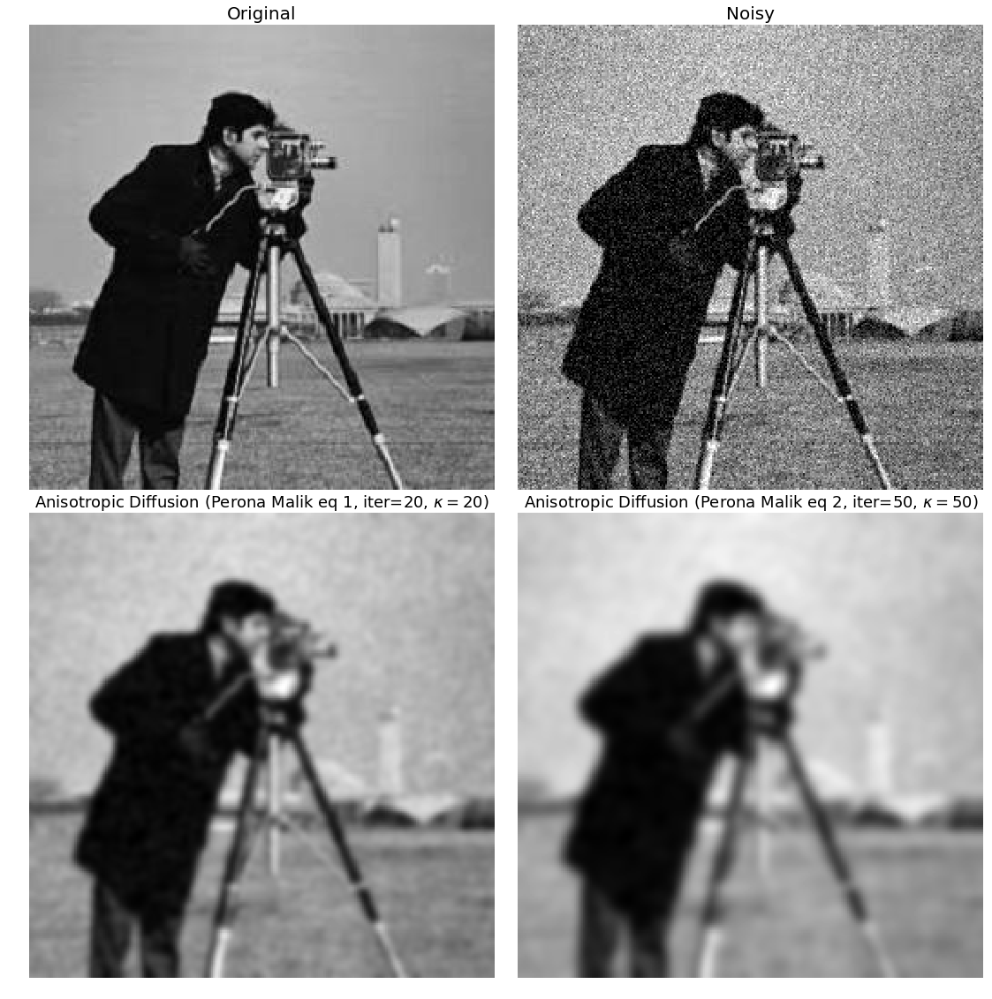

In [28]:
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.util import random_noise
import matplotlib.pylab as plt
from skimage.color import rgb2gray
from skimage.io import imread
import numpy as np

img = rgb2gray(imread('images/cameraman.png'))
noisy = random_noise(img, var=0.01)
noisy = np.clip(noisy, 0, 1)
plt.figure(figsize=(15,15))
plt.gray()
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(221), plt.imshow(img), plt.axis('off'), plt.title('Original', size=20)
plt.subplot(222), plt.imshow(noisy), plt.axis('off'), plt.title('Noisy', size=20)
diff_out = anisotropic_diffusion(noisy, niter=20, kappa=20, option=1)
plt.subplot(223), plt.imshow(diff_out), plt.axis('off'), plt.title(r'Anisotropic Diffusion (Perona Malik eq 1, iter=20, $\kappa=20$)', size=18)
diff_out = anisotropic_diffusion(noisy, niter=50, kappa=100, option=2)
plt.subplot(224), plt.imshow(diff_out), plt.axis('off'), plt.title(r'Anisotropic Diffusion (Perona Malik eq 2, iter=50, $\kappa=50$)', size=18)
plt.show()